# Домашнее задание №3

Задание присылать на обе почты почты aleksartamonov@gmail.com dashkov.alexander.om@gmail.com в виде ссылки на colab

В теме письма указать **CV_HSE_2021 HW3 <Фамилия Имя>**

soft deadline: 21.03.2021T23:59:00+0300

hard deadline: 28.03.2021T23:59:00+0300


## Legacy классификация

**Задане 1 (10 баллов)**

Реализуйте функцию, которая строит банк фильтров Габора.
Реализуйте интерактивный инструмент, в котором с помощью 2-х ползунков, один из которых отвечает за угол, другой за масштаб для фильтров из банка, можно выбрать конкретный фильтр и на экране отобразятся:
- Фильтр в пространственной области
- Фильтр в частотном пространстве
- Результат применения этого фильтра к какому-нибудь изображению.

In [ ]:
import cv2
import numpy as np
import ipywidgets as widgets
import matplotlib.pyplot as plt

In [ ]:
def gabour_bank(size, phi_bins, scale_bins, max_scale, min_scale, ):
    """
    Parameters:
    size (tuple|int): Size or radius of filters.
    phi_bins (int): Number of angle beens of bank
    scale_bins (int): Number of scales betwwen max_scale and min_scale
    max_scale (float): Max frequency covered by bank
    min_scale (float): Min frequency covered by bank
    Returns:
    list: a list of filters
    """
    angles = np.linspace(0, np.pi, num=phi_bins, endpoint=False) 
    frequences = np.linspace(min_scale, max_scale, num=scale_bins)

    bank = np.zeros((phi_bins, scale_bins, size, size))
    for i, angle in enumerate(angles):
        for j, freq in enumerate(frequences):
            bank[i, j] = cv2.getGaborKernel(ksize=(size, size), sigma=4, theta=angle, lambd=freq, gamma=0.5)

    return bank

In [ ]:
def shift_fft(filter):
    step1 = np.fft.fft2(filter)
    step2 = np.abs(np.fft.fftshift(step1))
    step3 = np.log(step2 + 1e-10)
    return step3

In [ ]:
img = cv2.imread('/content/Gray_dactylography.png', 0)

size = 101
phi_bins = 50
scale_bins = 100
max_scale = 30
min_scale = 0.1

bank = gabour_bank(size, phi_bins, scale_bins, max_scale, min_scale)
angles_ = np.linspace(0, np.pi, num=phi_bins, endpoint=False) 
frequences_ = np.linspace(min_scale, max_scale, num=scale_bins)

angles, frequences = map(lambda a: np.around(a, decimals=2), [angles_, frequences_])
indx = {(str(angles[i]), str(frequences[j])): (i, j) for i in range(phi_bins) for j in range(scale_bins)}

In [ ]:
def plot(filter, fourier_filter, img, size=5):
    filtered_img = cv2.filter2D(img, cv2.CV_8UC3, filter)
    fig, ax = plt.subplots(1, 3, figsize=(4.5*size, size))

    ax[0].set_title('Filter')
    ax[0].set_axis_off()
    ax[0].imshow(filter, cmap='gray')
    
    ax[1].set_title('Fourier')
    ax[1].set_axis_off()
    ax[1].imshow(fourier_filter, cmap='gray')
    
    ax[2].set_title('Applied')
    ax[2].set_axis_off()
    ax[2].imshow(filtered_img, cmap='gray')

    # plt.tight_layout()

In [ ]:
@widgets.interact(freq=widgets.SelectionSlider(options=frequences), angle=widgets.SelectionSlider(options=angles))
def interactive_plot(freq=frequences, angle=angles):
    angle_ = str(angle)
    freq_ = str(freq)
    i, j = indx[(angle_, freq_)]

    gabour = bank[i][j]
    fourier = shift_fft(gabour)

    plot(gabour, fourier, img)

interactive(children=(SelectionSlider(description='freq', options=(0.1, 0.4, 0.7, 1.01, 1.31, 1.61, 1.91, 2.21…

---


**Задание 2 (15 баллов)** 

Постройте мешок визульных слов на основе SIFT дескртипторов для датасета из третьего задания. Для этого для каждой картинки примените функцию, которая извлекает sift keypoints с дексрипторами, для каждой картинки ограничьтесь, например, сотней. Проведите кластеризацию на N(~30) классов, для каждого кластра отбразите в ряду 5 репрезентативных к нему участков изображений, в соответствии с масштабом keypoint-а. отобразите N таких строк.

In [ ]:
import glob
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/CV/test/pic
!ls

/content/drive/MyDrive/CV/test/pic
pic000000.jpg  pic002140.jpg  pic004280.jpg  pic006420.jpg  pic008560.jpg
pic000001.jpg  pic002141.jpg  pic004281.jpg  pic006421.jpg  pic008561.jpg
pic000002.jpg  pic002142.jpg  pic004282.jpg  pic006422.jpg  pic008562.jpg
pic000003.jpg  pic002143.jpg  pic004283.jpg  pic006423.jpg  pic008563.jpg
pic000004.jpg  pic002144.jpg  pic004284.jpg  pic006424.jpg  pic008564.jpg
pic000005.jpg  pic002145.jpg  pic004285.jpg  pic006425.jpg  pic008565.jpg
pic000006.jpg  pic002146.jpg  pic004286.jpg  pic006426.jpg  pic008566.jpg
pic000007.jpg  pic002147.jpg  pic004287.jpg  pic006427.jpg  pic008567.jpg
pic000008.jpg  pic002148.jpg  pic004288.jpg  pic006428.jpg  pic008568.jpg
pic000009.jpg  pic002149.jpg  pic004289.jpg  pic006429.jpg  pic008569.jpg
pic000010.jpg  pic002150.jpg  pic004290.jpg  pic006430.jpg  pic008570.jpg
pic000011.jpg  pic002151.jpg  pic004291.jpg  pic006431.jpg  pic008571.jpg
pic000012.jpg  pic002152.jpg  pic004292.jpg  pic006432.jpg  pic008572.jpg
pic

In [ ]:
def get_features(n_features):
    sift = cv2.SIFT_create(nfeatures=n_features)
    keypoints = []
    descriptors = []
    imgs = []

    for pic in glob.glob('pic*'):
        img = cv2.imread(pic)
        keypoints_, descriptors_ = sift.detectAndCompute(img, None)

        if descriptors_ is not None:
            keypoints.extend(keypoints_)
            descriptors.extend(descriptors_)
            imgs.extend([pic] * len(keypoints_))

    keypoints = np.array(keypoints)
    descriptors = np.array(descriptors, dtype='int')
    imgs = np.array(imgs)

    return keypoints, descriptors, imgs

In [ ]:
def plot_imgs(clusters, keypoints, descriptors, imgs, nn_nei):

    for cluster in clusters:
        distances = np.linalg.norm(descriptors - cluster, axis=1)
        best_indx = np.argsort(distances)[:100]
        
        pairs = zip(keypoints[best_indx], imgs[best_indx])
        sorted_pairs = sorted(pairs, key=lambda pair: pair[0].size, reverse=True)[:nn_nei]

        fig, axs = plt.subplots(1, nn_nei, figsize=(15, 7.5))
        for (keypoint, img), ax in zip(sorted_pairs, axs):
            img = cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2RGB)
            img = cv2.drawKeypoints(img, [keypoint], None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
            ax.set_axis_off()
            ax.imshow(img)

In [ ]:
%%time
n_features = 100
n_clusters = 30
nn_nei = 5

keypoints, descriptors, imgs = get_features(n_features)

CPU times: user 1min 45s, sys: 13.5 s, total: 1min 58s
Wall time: 1min 35s


In [ ]:
%%time
kmeans = KMeans(n_clusters=n_clusters)
kmeans.fit(descriptors)

CPU times: user 13min 42s, sys: 3min 36s, total: 17min 19s
Wall time: 12min 41s


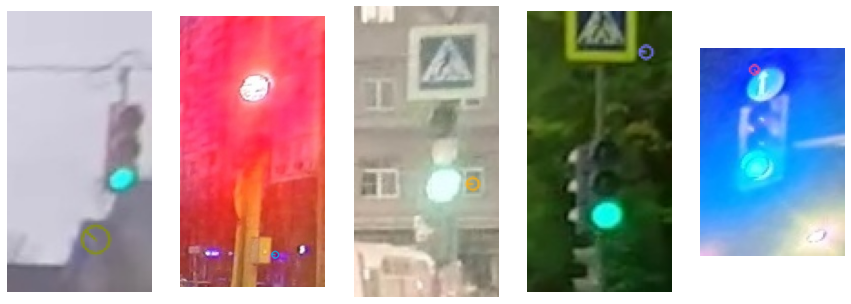

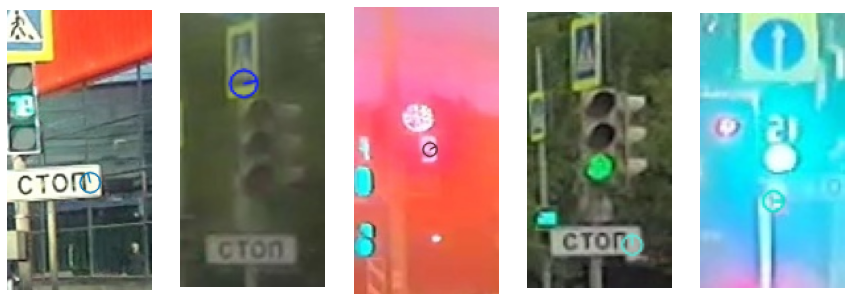

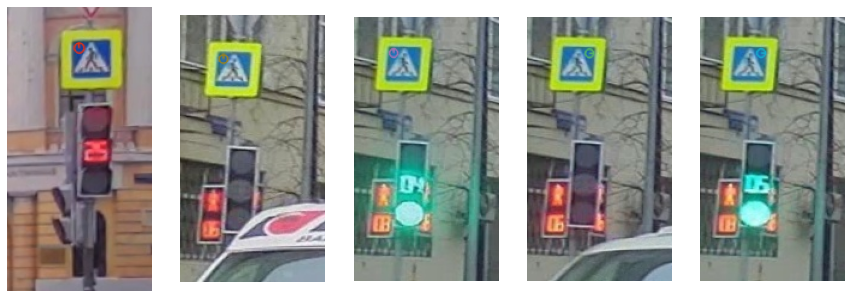

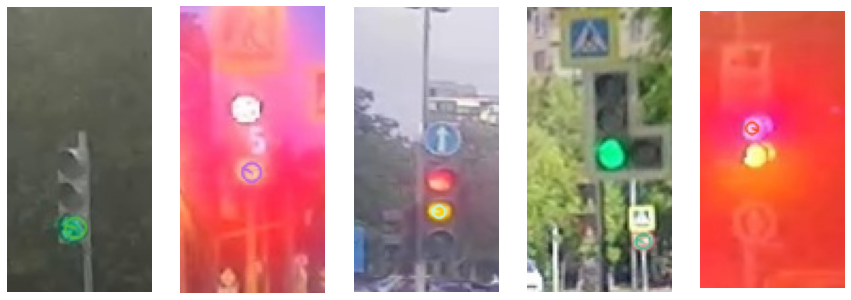

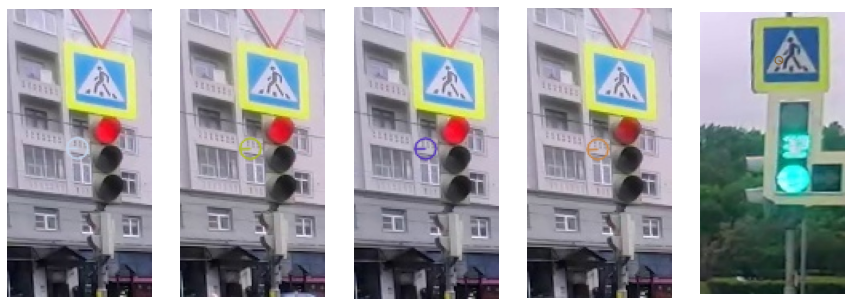

...

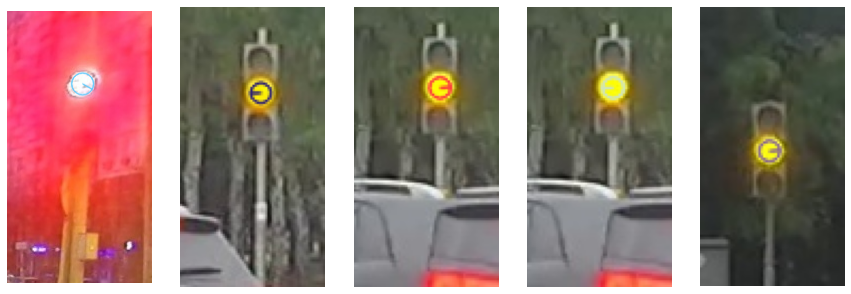

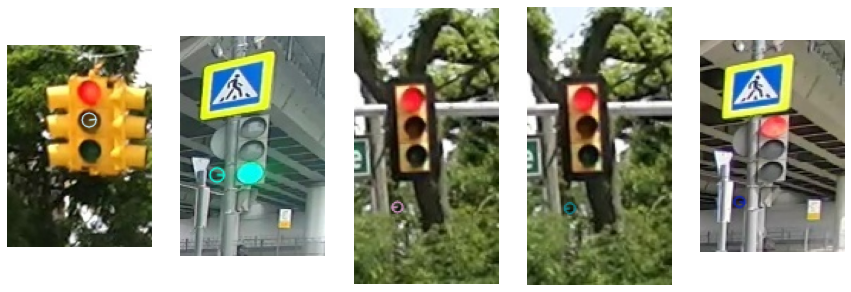

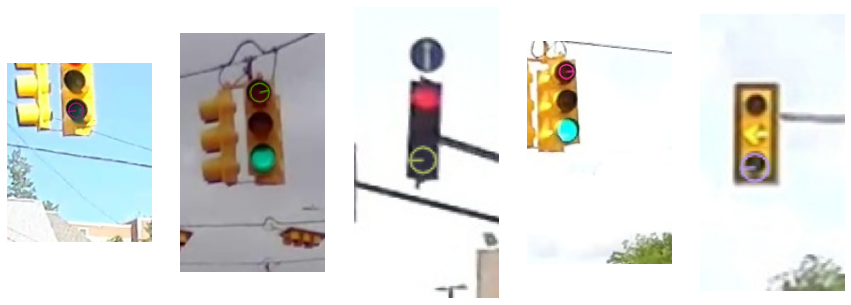

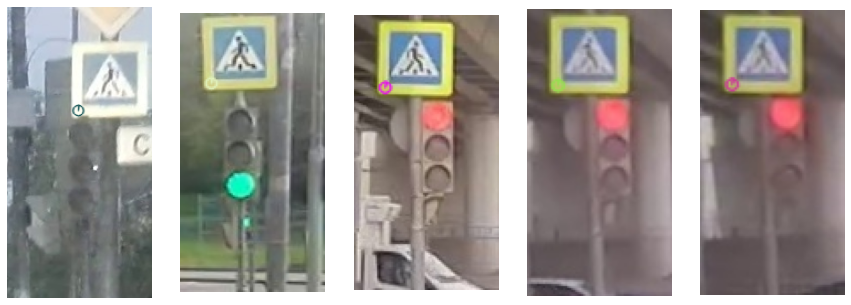

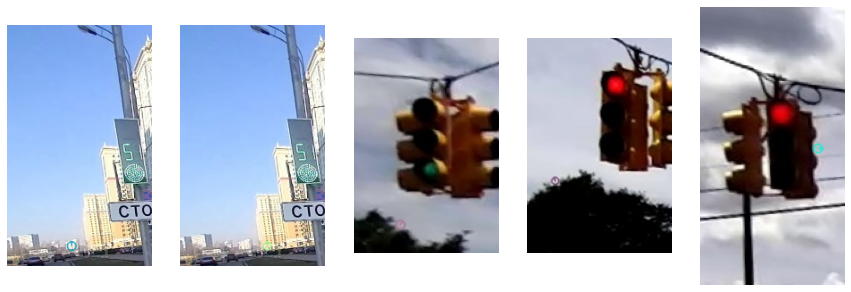

In [ ]:
plot_imgs(kmeans.cluster_centers_, keypoints, descriptors, imgs, nn_nei)

---


**Задание 3 (20 баллов)**

[КОНКУРС](https://youtu.be/8GGWedu77SA?t=3388)

В этом задании вам придется проявить изобретательность. Используйте банки фильтов, мешки визуальных слов и гистрограммы для достижения максимального скора. [Настоящая ссылка на конкурс](https://www.kaggle.com/t/65dc3b38e1194d488ab276752fd1e92d). В этом задании баллы будут распределяться согласно тому, как далеко вы продвинулись на лидерборде. **Важное условие**, весь ваш код положите в этот ноутбук, в нем не должно быть нейросетей =) Только legacy только *hard core*